### Imports needed to run the report

In [1]:
%matplotlib inline
# Only if you have a high-resolution "retina" display:
%config InlineBackend.figure_format = 'retina'

import numpy
import numpy as np
from scipy import interpolate
from scipy.misc import derivative

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import matplotlib.patheffects as pe

plt.rc('legend', frameon=False)
plt.rc('figure', figsize=(10, 8))  # Larger figure sizes
plt.rc('image', origin='lower')  # Make image zero on bottom
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams["figure.figsize"] = (8,8)
plt.rcParams['font.size'] =  16.0

from astropy import units
from astropy import constants
from astropy.table import QTable  # to use tables with units
from astropy.visualization import quantity_support
quantity_support()

from functools import wraps # This convenience func preserves name and docstring

i_units = units.Quantity(1, unit="kW m-2 sr-1 Hz-1")

**Class**

We start off by creating a class to hold the dataset. This class can then be expanded with methods needed for calculationg and data analysis.

In [2]:
class solar_spot:
    def __init__(self, DATA_FILE, rest_wavelength_):
        """
        Takes in DATA_FILE as string argument and rest_wavelength_ in [nm] and stores as variables
        """
        self.data = QTable.read(DATA_FILE)
        self.wave0 = rest_wavelength_
        
        #calculating inverted porofiles for later use
        self.data['intensity_inverted'] = self.data['intensity'][0] - self.data['intensity']
        self.data['stokes_v_inverted'] = self.data['stokes_v'][0] - self.data['stokes_v']

# WRITING ABOUT MOMENTS ECT, GAUSSIAN

**Also why do we force moment2 >= 0 ?**

In [3]:
def calculate_moments(self): 
    sp = self.data['intensity_inverted']
    wv = self.data['wavelength']
    wave0 = self.wave0

    #calculating moments
    moment1 = numpy.trapz(wv[:, numpy.newaxis, numpy.newaxis] * sp, wv, axis=0) / numpy.trapz(sp, wv, axis=0)
    moment2 = numpy.trapz((wv[:, numpy.newaxis, numpy.newaxis] - moment1)**2 * sp, wv, axis=0)\
                          / numpy.trapz(sp, wv, axis=0)
    moment2[moment2 < 0] = 0
    
    self.moment1 = moment1
    self.moment2 = moment2
    
solar_spot.calculate_moments = calculate_moments

# WRITING about line of sight velocity and line widths

In [4]:
def calculate_v_los_FWHM(self):
    wave0 = self.wave0; moment1 = self.moment1; moment2 = self.moment2
    #line of sight velocity 
    v_los = (constants.c * (wave0 - moment1) / wave0).to('km/s')

    #Full width half maximum
    FWHM = 2*np.sqrt(2*np.log(2)) * np.sqrt(moment2)
    #converting to km/s
    FWHM *= constants.c/rest_wavelength
    
    self.FWHM = FWHM.to('km/s')
    self.v_los = v_los
    
solar_spot.calculate_v_los_FWHM = calculate_v_los_FWHM

# WRITING ABOUT BRIGHTNESS TEMPERATURE, INVERTING PLANCK ECT

Planck function:
\begin{equation} 
   B_\nu(T) = \frac{2h\nu^3}{c^2} 
                  \frac{1}{\mathrm{e}^{h\nu/ kT}-1}
\end{equation}

Inverted Planck function:
\begin{equation}
    \mathrm{e}^{h\nu/ kT}  
    = \frac{2h\nu^3}{c^2} 
    \left(B_\nu(T)\right)^{-1}
    + 1
\end{equation}

\begin{equation}
    h\nu/ kT  
    = \ln{\left[\frac{2h\nu^3}{c^2} 
    \left(B_\nu(T)\right)^{-1}
    + 1\right]}
\end{equation}

\begin{equation}
    T = \frac{h\nu}{k}
    \left(\ln{\left[\frac{2h\nu^3}{c^2} 
    \left(B_\nu(T)\right)^{-1}
    + 1\right]}\right)^{-1}
\end{equation}

Inserting $\left(B_\nu(T_b)\right)^{-1} = I_{\nu}^{obs}$ gives

\begin{equation}
    T_b = \frac{h\nu}{k}
    \left(\ln{\left[\frac{2h\nu^3}{c^2}\left(I_{\nu}^{obs}\right)^{-1}
    + 1\right]}\right)^{-1}
\end{equation}

In [5]:
def calculate_brightness_temperature(self):
    #adding brightness temperature to dataset
    k, h, c = constants.k_B, constants.h, constants.c

    nu = self.data['wavelength'].to(units.Hz, equivalencies=units.spectral())
    intensity = self.data['intensity']

    T_b = h*nu/k * numpy.log((2*h*nu**3)/(c**2 * intensity.T*units.sr) + 1)**(-1)
    T_b = T_b.decompose()
    self.data['brightness_temperature'] = T_b.T

solar_spot.calculate_brightness_temperature = calculate_brightness_temperature

## Maybe something about gaussian fit ect. Maybe this should be straight after moments??
## Or this can be added later, same time as interpolation?

$$
  f(x, \mu, \sigma) = \frac{1}{\sigma\sqrt{2\pi}} 
  \exp\left( -\frac{1}{2}\left(\frac{x-\mu}{\sigma}\right)^{\!2}\,\right).
$$

$$
\frac{\partial f}{\partial x} = -f(x, \mu, \sigma) \frac{x-\mu}{\sigma^2}.
$$

In [6]:
def calculate_gaussian_fit(self, x, y, wavelengths):
    """
    Input is point x,y where gaussian is fit and an array of wavelengths with any number of points.
    Finds gaussian fit at given point x,y for an array of wavelengths
    Returns dict with gaussian fit for the intensity, inverted intensity and their derivatives
    """
    data = self.data; moment1 = self.moment1; moment2 = self.moment2

    def gaussian(x, mu, var): 
        """Regular 1D-PDF"""
        return 1/(numpy.sqrt(var)*numpy.sqrt(2*numpy.pi))*numpy.exp(-0.5*(x-mu)**2/var)
    
    def dgaussian_dx(x, mu, var, f=gaussian):
        """Derivative of 1D-PDF"""
        return - f * (x-mu)/var

    def scaleBetween(unscaledNum, minAllowed, maxAllowed, minNum, maxNum):
        """
        This is for scaling the gaussian with the right units
        """
        return (maxAllowed - minAllowed) * (unscaledNum - minNum) / (maxNum - minNum) + minAllowed;

    #setting up dict for different fits
    fits = {}
    
    fits['intensity_inverted'] = gaussian(wavelengths, moment1[y,x], moment2[y,x])
    #fixing units
    fits['intensity_inverted'] *= units.nm * i_units
    #scaling
    fits['intensity_inverted'] = scaleBetween(fits['intensity_inverted']\
                                              , numpy.min(data['intensity_inverted'][:,y,x])\
                                              , numpy.max(data['intensity_inverted'][:,y,x])\
                                              , numpy.min(fits['intensity_inverted'])\
                                              , numpy.max(fits['intensity_inverted']))

    fits['intensity_inverted_derivative'] = dgaussian_dx(wavelengths\
                                                         , moment1[y,x]\
                                                         , moment2[y,x]\
                                                         , fits['intensity_inverted'])

    #inverting back, but now shape is correct so only scaling needed is to add intensity[0] value
    fits['intensity'] = fits['intensity_inverted'][0] + data['intensity'][0,y,x] - fits['intensity_inverted']

    fits['intensity_derivative'] = fits['intensity_inverted_derivative'][0] - fits['intensity_inverted_derivative']
    return fits

solar_spot.calculate_gaussian_fit = calculate_gaussian_fit

## Interpolation

In [7]:
def calculate_interpolation_fit(self, x, y, kind_='quadratic'):
    data = self.data
    interpolation_function = interpolate.interp1d(data['wavelength']\
                                                  , data['intensity'][:, y, x], kind=kind_)
    return interpolation_function
    
solar_spot.calculate_interpolation_fit = calculate_interpolation_fit

## Creating plot functions for gaussian and interpolation

In [8]:
def plot_gaussian_fit_on_intensity(self, ax, x, y, wavelengths, with_wave0=True):
    data = self.data
    
    if with_wave0:
        ax.axvline(x=self.wave0, ymin=0, ymax=1, linestyle='--', color='black', label=r"$\lambda_0$")
    
    fits = self.calculate_gaussian_fit(x, y, wavelengths)
    
    ax.set_xlabel("Wavelength [{}]".format(wavelengths.unit))
    ax.set_ylabel(r"Intensity [{}]".format(data['intensity'].unit))
    ax.scatter(data['wavelength'], data['intensity'][:,y,x], label="Data", color='blue')
    ax.plot(wavelengths, fits['intensity'], label="Gaussian fit", color='green')
    ax.legend()
    
solar_spot.plot_gaussian_fit_on_intensity = plot_gaussian_fit_on_intensity

In [9]:
def plot_interpolation_on_intensity(self, ax, x, y, wavelengths, kind_='quadratic', with_wave0=True, loc='lower left'):
    data = self.data
    if with_wave0:
        ax.axvline(x=self.wave0, ymin=0, ymax=1, linestyle='--', color='black', label=r"$\lambda_0$")
    
    interpolation_function = self.calculate_interpolation_fit(x, y, kind_=kind_)
    
    ax.set_xlabel("Wavelength [{}]".format(wavelengths.unit))
    ax.set_ylabel(r"Intensity [{}]".format(data['intensity'].unit))
    ax.scatter(data['wavelength'], data['intensity'][:,y,x], label="Data", color='blue')
    ax.plot(wavelengths, interpolation_function(wavelengths), label="{} interpolation".format(kind_), color='green')
    ax.legend(loc=loc)
    
solar_spot.plot_interpolation_on_intensity = plot_interpolation_on_intensity

# WRITE ABOUT B-field los, ect

\begin{equation}
    B_\mathrm{los} 
    = -\frac{4 \pi m_e c}{e \bar{g} \lambda_0^2}\frac{\sum_\lambda \frac{\partial I}{\partial \lambda} V_\lambda}{\sum_\lambda\left(\frac{\partial I}{\partial \lambda}\right)^2}
\end{equation}

In [10]:
def calculate_B_los(self):
    """
    calculates line of sight magnetic field strength
    """
    #fetching some constants
    pi = numpy.pi
    m_e = constants.m_e
    c = constants.c
    e = constants.e.si
    g = 2.499 #Lande factor
    
    wave0 = self.wave0; data = self.data
    
    diff_intensity = numpy.diff(data['intensity'], axis=0)
    diff_wl = numpy.diff(data['wavelength'])
    dIdlambda = diff_intensity.T/diff_wl
     
    const = -4 * pi * m_e * c / (e * g * rest_wavelength**2)
    
    B_los = const * (np.sum(dIdlambda.T * data['stokes_v'][0:-1], axis=0)/ np.sum(dIdlambda**2,axis=2).T)
    
    self.B_los = B_los.to('tesla')

solar_spot.calculate_B_los = calculate_B_los

Creating a call function to all of bla bla bla. These are calculations that want to be run.

In [11]:
def __call__(self):
    self.calculate_moments()
    self.calculate_v_los_FWHM()
    self.calculate_brightness_temperature()
    self.calculate_B_los()
    
solar_spot.__call__ = __call__

## AND HERE IS THE CODE FOR PLOTTING
First we create a general plot function that creates a grid image with a colorbar. This can then be used by our other plotting functions.

In [12]:
def plot_with_colorbar(plot_data, ax, axlim, cmap_, clim_, label_):
    if not all(i is None for i in axlim):
        ax.set_xlim(axlim[0], axlim[1])
        ax.set_ylim(axlim[2], axlim[3])
    
    im = ax.imshow(plot_data, cmap=cmap_)
    if clim_!= None: 
        im.set_clim(clim_[0],clim_[1])
        
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label(label_)
    
    return im

Then the plotting functions.

In [13]:
def plot_intensity(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]
    
    plot_data = self.data['intensity'][wavelength_index]
    
    label_ = r"Intensity [{}]".format(plot_data.unit)
 
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_intensity = plot_intensity

In [14]:
def plot_stokes_v(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='gist_gray', clim_=None):
        axlim = [xmin, xmax, ymin, ymax]
    
        plot_data = self.data['stokes_v'][wavelength_index]

        label_ = r"Stokes V [{}]".format(plot_data.unit)

        return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_stokes_v = plot_stokes_v

In [15]:
def plot_los_velocity(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='RdBu', clim_=(-3,3)):
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.v_los

    label_ = r'Velocity [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_los_velocity = plot_los_velocity

In [16]:
def plot_brightness_temperature(self, ax, wavelength_index, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):  
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.data['brightness_temperature'][wavelength_index]

    label_ = r'Temperature [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_brightness_temperature = plot_brightness_temperature

In [17]:
def plot_B_los(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='inferno', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]

    plot_data = self.B_los

    label_ = r'Magnetic field [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_B_los = plot_B_los

In [18]:
def plot_FWHM(self, ax, xmin=None, xmax=None, ymin=None, ymax=None, cmap_='RdBu_r', clim_=None):
    axlim = [xmin, xmax, ymin, ymax]
    
    plot_data = self.FWHM
    
    label_ = r'FWHM [{}]'.format(plot_data.unit)
    
    return plot_with_colorbar(plot_data.value, ax, axlim, cmap_, clim_, label_)

solar_spot.plot_FWHM = plot_FWHM

## Adding scale bar and distance function to plots

In [19]:
fontprops = fm.FontProperties(size=16, weight="bold")
real_world_pixel_length = 42.46 #in km

def add_scale_bar(ax, color_='white', bar_length_percentage = 0.25, loc='lower left'):
    xsize = ax.get_xlim()[1] - ax.get_xlim()[0]
    full_length = real_world_pixel_length * xsize

    percentage_occupied = 0.25
    #calculating length of bar in km
    bar_length = xsize * bar_length_percentage * real_world_pixel_length
    #scaling to closest base10 number
    scaled_bar_length = 10**(np.floor(np.log10(bar_length)-np.log10(0.5)))
    #finding the pixel length of scaled_bar
    nex_xsize = int(scaled_bar_length/real_world_pixel_length)

    scaled_bar_length *= units.km
    
    scalebar = AnchoredSizeBar(ax.transData, nex_xsize, r'{:.0f}'.format(scaled_bar_length), loc, pad=0.2\
                           , borderpad=0.3, color=color_, frameon=False\
                           , size_vertical=4, fontproperties=fontprops)

    ax.add_artist(scalebar)    

In [20]:
def add_distance_line(ax, line_start, line_end, line_color='red', stroke_color='white'):
    x1 = line_start[0]; x2 = line_end[0]
    y1 = line_start[1]; y2 = line_end[1]
    
    #adding line between points
    ax.plot([x1,x2], [y1,y2], 'o-', color=line_color, lw=2\
               , path_effects=[pe.Stroke(linewidth=4, foreground=stroke_color), pe.Normal()])

    #calculating line length with pytagoras
    line_length = np.sqrt((x2-x1)**2 + (y2-y1)**2)\
                * real_world_pixel_length * units.km
    #calulating midpoint of line
    line_midpoint = [int((x1+x2)/2), int((y1+y2)/2)]
    
    #calculating angle to rotate text on line
    #first quadrant
    if (y2-y1)>=0 and (x2-x1)>=0:
        line_rot = np.arctan((y2-y1)/(x2-x1))

    #second quadrant
    if (y2-y1)>=0 and (x2-x1)<0:
        line_rot = np.arctan((x1-x2)/(y2-y1)) + np.pi/2 + np.pi

    #third quadrant
    if (y2-y1)<0 and (x2-x1)<0:
        line_rot = np.arctan((y1-y2)/(x1-x2)) + 2*np.pi

    #fourth quadrant
    if (y2-y1)<0 and (x2-x1)>=0:
        line_rot = np.arctan((y2-y1)/(x2-x1)) + 2*np.pi

    line_rot = np.degrees(line_rot)
    #adding text to line
    ax.text(line_midpoint[0], line_midpoint[1], '{:.0f}'.format(line_length), color=line_color,\
              path_effects=[pe.withStroke(linewidth=3, foreground=stroke_color)]\
              ,horizontalalignment='center',verticalalignment='center', fontsize='20', rotation = line_rot)

## Function to place (x,y) marker on canvas

In [32]:
def plot_point_of_intrest(self, ax, x, y, label, main_color, edge_color='black'\
                          , size=20, T_b=False, wavelength_index=None\
                          , FWHM=None, B_los=None):
                          
    ax.plot([x,x], [y,y], marker = 'o', markersize=size, markeredgecolor=edge_color\
            , markerfacecolor=main_color, label=label)
    
    if T_b:
        point_value = self.data['brightness_temperature'][wavelength_index, y, x]

    elif FWHM:
        point_value = self.FWHM[y,x]
        
    elif B_los:
        point_value = self.B_los[y,x]
    
    if T_b or FWHM or B_los:
        ax.text(x+5, y, '{:.0f}'.format(point_value), color=main_color,\
                  path_effects=[pe.withStroke(linewidth=2, foreground=edge_color)]\
                  ,horizontalalignment='left',verticalalignment='center', fontsize=size*3)      

    ax.legend()
    
solar_spot.plot_point_of_intrest = plot_point_of_intrest

## Adding class pointer and calling class

In [22]:
DATA_FILE = 'SST_sunspot_617_2020_08_07.fits' 
rest_wavelength = 617.30 * units.nm #FeI

SST_sunspot = solar_spot(DATA_FILE, rest_wavelength)
SST_sunspot()

# TESTING THE FUNCTIONS

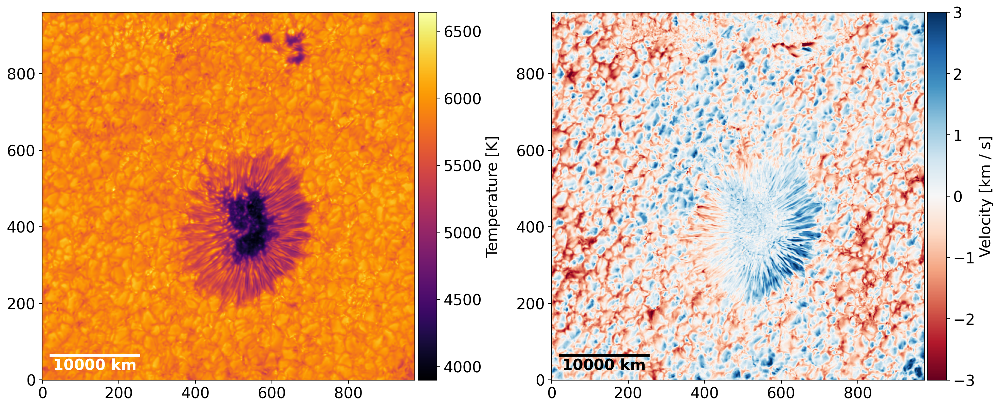

In [30]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_brightness_temperature(ax[0], wavelength_index=3)
im2 = SST_sunspot.plot_los_velocity(ax[1])
add_scale_bar(ax[0])
add_scale_bar(ax[1], color_='black')

fig.tight_layout()

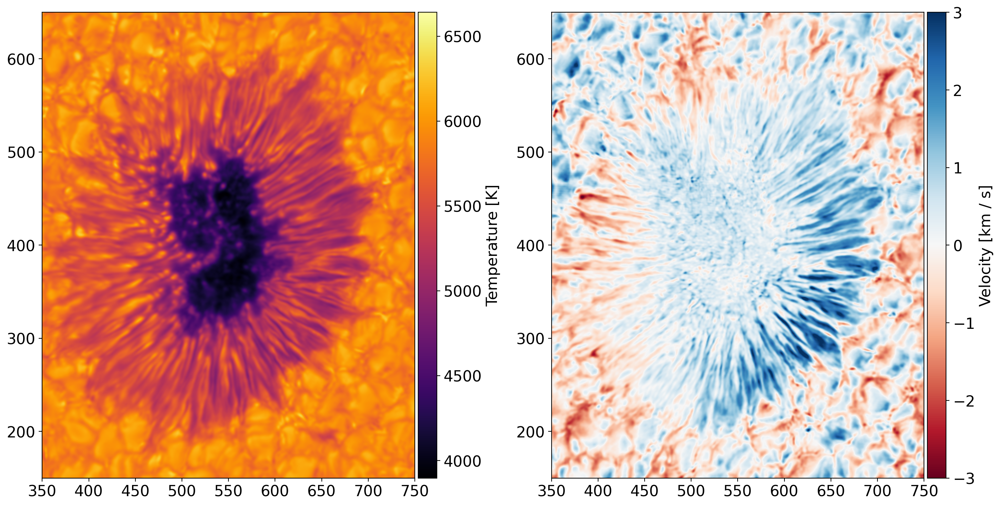

In [24]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_brightness_temperature(ax[0], wavelength_index=3,xmin=350, xmax=750, ymin=150, ymax=650)
im2 = SST_sunspot.plot_los_velocity(ax[1],xmin=350, xmax=750, ymin=150, ymax=650)

fig.tight_layout()

## Just checking if interpolation works better (it does)

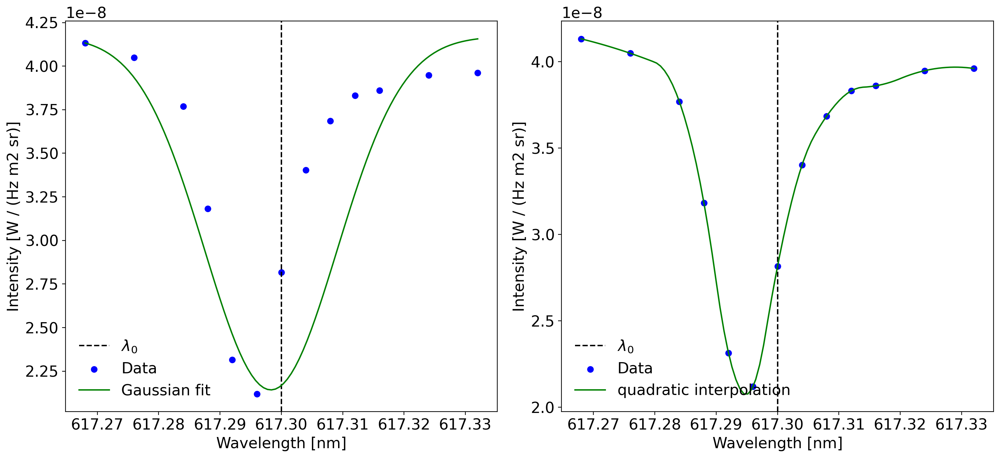

In [25]:
wavelengths = numpy.linspace(SST_sunspot.data['wavelength'][0], SST_sunspot.data['wavelength'][-1], 100)

plot_location =[100, 200]

fig, ax = plt.subplots(1,2, figsize=(15,7)) 
SST_sunspot.plot_gaussian_fit_on_intensity(ax[0], plot_location[0], plot_location[1], wavelengths)

SST_sunspot.plot_interpolation_on_intensity(ax[1], plot_location[0], plot_location[1], wavelengths)

fig.tight_layout()

## Magnetic field vs. intensity

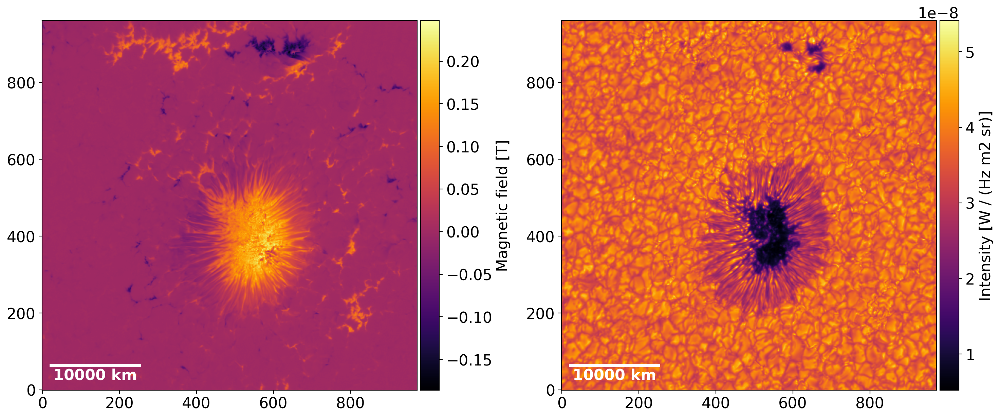

In [26]:
fig, ax = plt.subplots(1,2, figsize=(15,10)) 
im1 = SST_sunspot.plot_B_los(ax[0])
im2 = SST_sunspot.plot_intensity(ax[1], wavelength_index=0)
add_scale_bar(ax[0])
add_scale_bar(ax[1])

fig.tight_layout()

## Example with distance plotted between two points

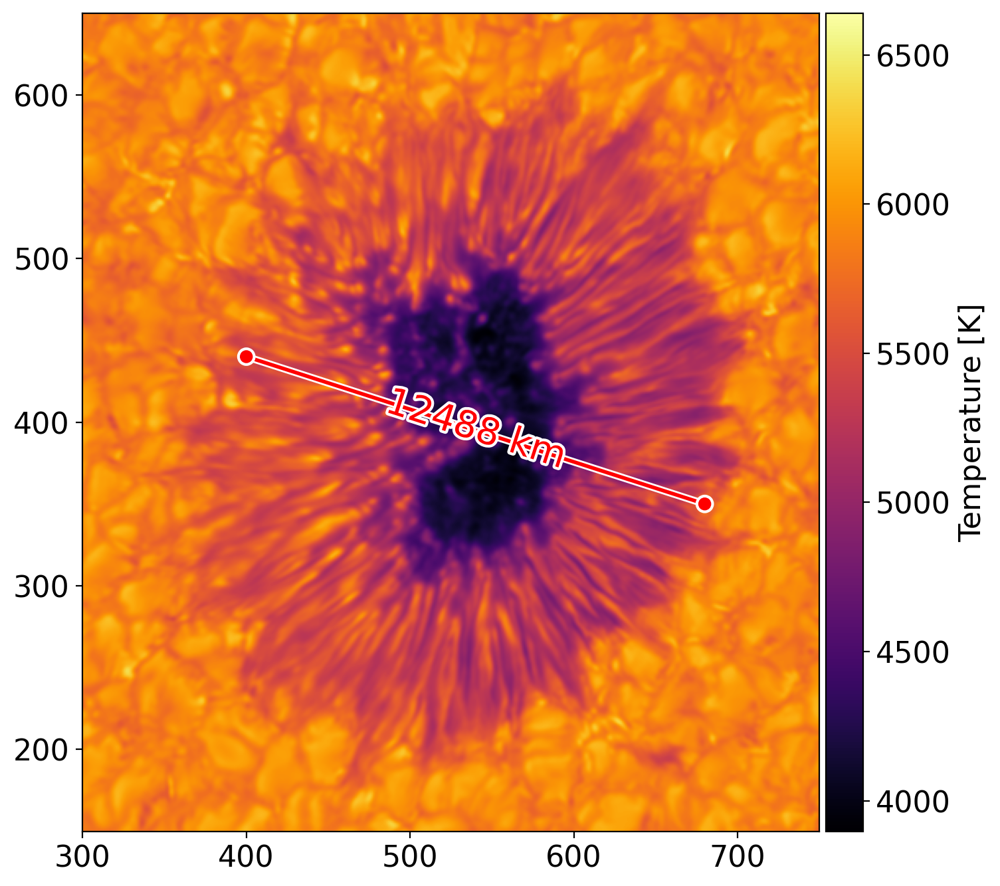

In [27]:
fig, ax = plt.subplots(figsize=(10,8))

im = SST_sunspot.plot_brightness_temperature(ax, wavelength_index=3, xmin=300, xmax=750, ymin=150, ymax=650)

line_start = [400, 440]; line_end = [680, 350]
add_distance_line(ax, line_start, line_end)

#line_start = [500, 200]; line_end = [600, 600]
#add_distance_line(ax, line_start, line_end)

## Example on plotting dot on point of intrest

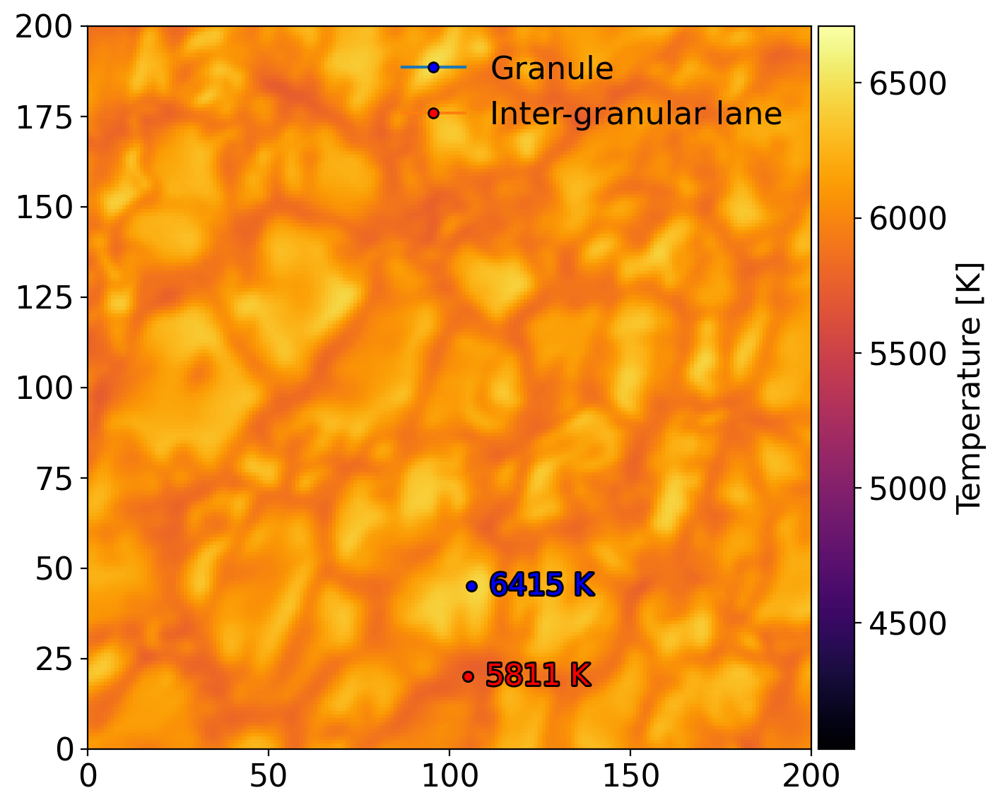

In [34]:
fig, ax = plt.subplots(figsize=(7,7)) 

wl_index = 0


im = SST_sunspot.plot_brightness_temperature(ax, wavelength_index=wl_index, xmin=0, xmax=200, ymin=0, ymax=200)

SST_sunspot.plot_point_of_intrest(ax, x=106, y=45, label='Granule', main_color='b', size=5, wavelength_index=wl_index, T_b=True)
SST_sunspot.plot_point_of_intrest(ax, x=105, y=20, label='Inter-granular lane', main_color='r', size=5, wavelength_index=wl_index, T_b=True)

#Need to convert to microtesla to see anything here
#SST_sunspot.plot_point_of_intrest(ax, x=106, y=45, label='Granule', main_color='b', size=5, wavelength_index=wl_index, B_los=True)
#SST_sunspot.plot_point_of_intrest(ax, x=105, y=20, label='Inter-granular lane', main_color='r', size=5, wavelength_index=wl_index, B_los=True)

